## Mounting the drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path_to_data='/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6'

In [ ]:
!pip install transformers

In [ ]:
!pip install sentencepiece

In [ ]:
# Importing all the modules
import os
import csv
import pandas as pd
import numpy as np
import torch
import argparse
import pickle
import logging
from tqdm import tqdm
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
import pickle
import numpy as np
import torch
import matplotlib.pyplot as plt
import warnings
import torch.nn as nn
import math
import torch
from sklearn import metrics
from torch.nn import BCEWithLogitsLoss
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import AdamW, XLNetTokenizer, XLNetModel, XLNetLMHeadModel, XLNetConfig
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
%matplotlib inline
warnings.filterwarnings('ignore')
%matplotlib notebook
%matplotlib inline

In [ ]:
df_label = pd.read_csv('/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/processed_data/labeled_1.csv')
df_unlabel = pd.read_csv('/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/processed_data/unlabeled_1.csv')

In [ ]:
df_unlabel.drop('Unnamed: 0', inplace = True, axis = 1)

In [ ]:
df_label.drop('Unnamed: 0', inplace = True, axis = 1)

## Solving for Q1:

In [ ]:
X_train, X_test = train_test_split(df_label, test_size=0.2, random_state=42)

In [ ]:
unlabeled_ind = round(len(df_unlabel)*1)
# Partition the data
X_unlabeled = df_unlabel.iloc[:unlabeled_ind]

# Check dimensions of data after splitting
print(f"X_train dimensions: {X_train.shape}")
print(f"X_test dimensions: {X_test.shape}")
print(f"X_unlabeled dimensions: {X_unlabeled.shape}")

X_train dimensions: (435, 3)
X_test dimensions: (109, 3)
X_unlabeled dimensions: (7343, 1)


In [ ]:
# train valid split
X_train, X_valid = train_test_split(X_train, test_size=0.1, random_state=42)

In [ ]:
X_train.shape, X_test.shape, X_valid.shape

((391, 3), (109, 3), (44, 3))

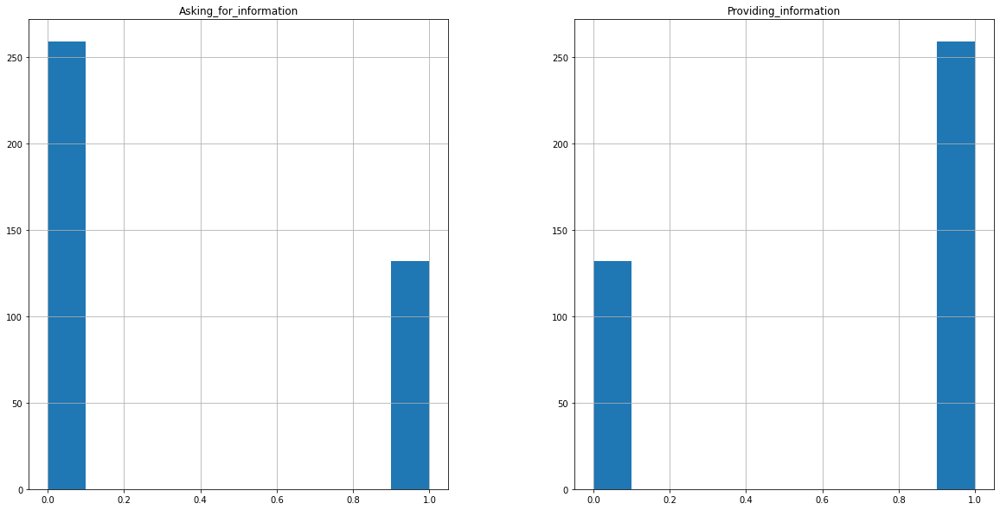

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10));
X_train[["Asking_for_information","Providing_information"]].hist(ax=ax);

## Preprocess Data

In [ ]:
def plot_sentence_embeddings_length(text_list, tokenizer):
    tokenized_texts = list(map(lambda t: tokenizer.tokenize(t), text_list))
    tokenized_texts_len = list(map(lambda t: len(t), tokenized_texts))
    fig, ax = plt.subplots(figsize=(8, 5));
    ax.hist(tokenized_texts_len, bins=40);
    ax.set_xlabel("Length of Comment Embeddings");
    ax.set_ylabel("Number of Comments");
    return

In [ ]:
tokenizer = XLNetTokenizer.from_pretrained('xlnet-base-cased', do_lower_case=True)

In [ ]:
train_text_list = X_train["full_text"].values
test_text_list = X_test["full_text"].values
valid_text_list = X_valid["full_text"].values
unlabeled_list = X_unlabeled["full_text"].values

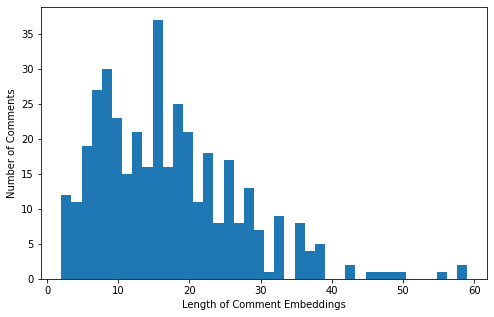

In [ ]:
plot_sentence_embeddings_length(train_text_list, tokenizer)

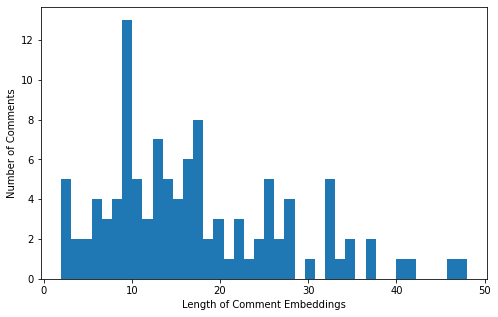

In [ ]:
plot_sentence_embeddings_length(test_text_list, tokenizer)

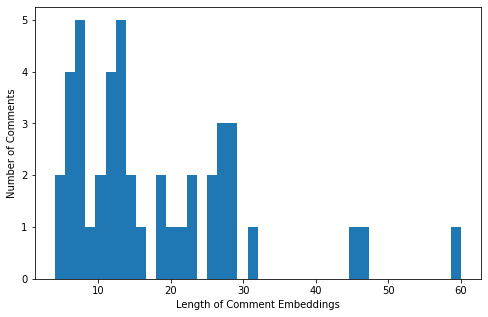

In [ ]:
plot_sentence_embeddings_length(valid_text_list, tokenizer)

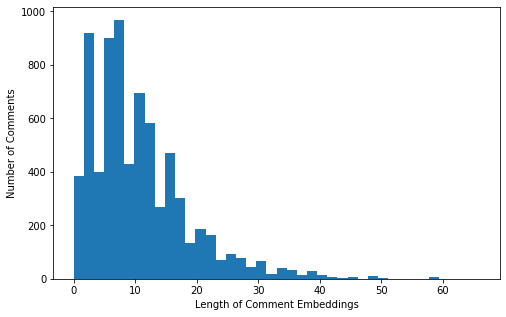

In [ ]:
plot_sentence_embeddings_length(unlabeled_list, tokenizer)

In [ ]:
def tokenize_inputs(text_list, tokenizer, num_embeddings=512):
    """
    Tokenizes the input text input into ids. Appends the appropriate special
    characters to the end of the text to denote end of sentence. Truncate or pad
    the appropriate sequence length.
    """
    # tokenize the text, then truncate sequence to the desired length minus 2 for
    # the 2 special characters
    tokenized_texts = list(map(lambda t: tokenizer.tokenize(t)[:num_embeddings-2], text_list))
    # convert tokenized text into numeric ids for the appropriate LM
    input_ids = [tokenizer.convert_tokens_to_ids(x) for x in tokenized_texts]
    # append special token "<s>" and </s> to end of sentence
    input_ids = [tokenizer.build_inputs_with_special_tokens(x) for x in input_ids]
    # pad sequences
    input_ids = pad_sequences(input_ids, maxlen=num_embeddings, dtype="long", truncating="post", padding="post")
    return input_ids

def create_attn_masks(input_ids):
    """
    Create attention masks to tell model whether attention should be applied to
    the input id tokens. Do not want to perform attention on padding tokens.
    """
    # Create attention masks
    attention_masks = []

    # Create a mask of 1s for each token followed by 0s for padding
    for seq in input_ids:
        seq_mask = [float(i>0) for i in seq]
        attention_masks.append(seq_mask)
    return attention_masks

In [ ]:
# create input id tokens
train_input_ids = tokenize_inputs(train_text_list, tokenizer, num_embeddings=250)
train_input_ids

array([[   80,    17,    88, ...,     0,     0,     0],
       [   17,   150,  1695, ...,     0,     0,     0],
       [   17,   150,  4113, ...,     0,     0,     0],
       ...,
       [  108,    17,   150, ...,     0,     0,     0],
       [  203,   199,   145, ...,     0,     0,     0],
       [24717,    47,    44, ...,     0,     0,     0]])

In [ ]:
# create input id tokens
test_input_ids = tokenize_inputs(test_text_list, tokenizer, num_embeddings=250)
test_input_ids

array([[   28,  3222,  9490, ...,     0,     0,     0],
       [  156,  3813,     4, ...,     0,     0,     0],
       [   17,   150,  2538, ...,     0,     0,     0],
       ...,
       [   17,   150,    64, ...,     0,     0,     0],
       [11752,    17,   150, ...,     0,     0,     0],
       [ 3482, 19387,    20, ...,     0,     0,     0]])

In [ ]:
# create input id tokens
valid_input_ids = tokenize_inputs(valid_text_list, tokenizer, num_embeddings=250)
valid_input_ids

array([[ 2027,  2711,    23, ...,     0,     0,     0],
       [  125,  2620, 19387, ...,     0,     0,     0],
       [   33,  7846,  1372, ...,     0,     0,     0],
       ...,
       [ 2117,   194,   349, ...,     0,     0,     0],
       [  143,    17,   150, ...,     0,     0,     0],
       [   36,  4069,  2027, ...,     0,     0,     0]])

In [ ]:
# create input id tokens
unlabeled_input_ids = tokenize_inputs(unlabeled_list, tokenizer, num_embeddings=250)
unlabeled_input_ids

array([[   80,    47,  2712, ...,     0,     0,     0],
       [   47,    44,  3037, ...,     0,     0,     0],
       [   80,    47,  2712, ...,     0,     0,     0],
       ...,
       [  113,    75, 19387, ...,     0,     0,     0],
       [   81,    38,   421, ...,     0,     0,     0],
       [ 2153,    36,    24, ...,     0,     0,     0]])

In [ ]:
# create attention masks
train_attention_masks = create_attn_masks(train_input_ids)
train_attention_masks

[[1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

In [ ]:
# create attention masks
test_attention_masks = create_attn_masks(test_input_ids)
test_attention_masks

[[1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

In [ ]:
# create attention masks
valid_attention_masks = create_attn_masks(valid_input_ids)
valid_attention_masks

[[1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

In [ ]:
# create attention masks
unlabeled_attention_masks = create_attn_masks(unlabeled_input_ids)
unlabeled_attention_masks

[[1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

In [ ]:
# add input ids and attention masks to the dataframe
X_train["features"] = train_input_ids.tolist()
X_train["masks"] = train_attention_masks

X_test["features"] = test_input_ids.tolist()
X_test["masks"] = test_attention_masks

X_valid["features"] = valid_input_ids.tolist()
X_valid["masks"] = valid_attention_masks

X_unlabeled["features"] = unlabeled_input_ids.tolist()
X_unlabeled["masks"] = unlabeled_attention_masks

In [ ]:
X_train.head()

,full_text,Asking_for_information,Providing_information,features,masks
335,we re probably only trying to keep your factor...,1,0,"[80, 17, 88, 885, 114, 619, 22, 435, 73, 3350,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
237,I dropped my mass by 0 02,0,1,"[17, 150, 1695, 94, 2027, 37, 700, 17, 3651, 4...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
193,I chose the smallest values to give smallest w...,0,1,"[17, 150, 4113, 18, 12381, 2982, 22, 371, 1238...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
47,the mass was 0 24 with the diameter at 70...,0,1,"[18, 2027, 30, 700, 923, 33, 18, 9503, 38, 241...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
116,I have mass equals to 0 12 and factorofs...,0,1,"[17, 150, 47, 2027, 2711, 23, 22, 700, 421, 21...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
X_test.head()

,full_text,Asking_for_information,Providing_information,features,masks
457,for flywheelthickness equals to 10 flywheeldia...,0,1,"[28, 3222, 9490, 138, 4287, 680, 2711, 23, 22,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
257,1 38,0,1,"[156, 3813, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
357,i haven t ever changed my broadcast,0,1,"[17, 150, 2538, 17, 46, 545, 1318, 94, 3037, 4...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
532,what economic value are you changing?,1,0,"[113, 531, 991, 41, 44, 3110, 82, 4, 3, 0, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
542,bearingoffset equals to only 60 so dc equals u...,0,1,"[7846, 1372, 4238, 2711, 23, 22, 114, 1639, 10...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
X_valid.head()

,full_text,Asking_for_information,Providing_information,features,masks
489,mass equals to an 52 factorofsafety equals to ...,0,1,"[2027, 2711, 23, 22, 48, 5085, 3350, 1168, 111...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
45,just reduced thickness to reduce mass increas...,0,1,"[125, 2620, 19387, 22, 1820, 2027, 1283, 3350,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
144,With bearingoffset equals to 60 and dc equal...,0,1,"[33, 7846, 1372, 4238, 2711, 23, 22, 1639, 21,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
408,they re going to leave make it very safe just ...,0,1,"[63, 17, 88, 223, 22, 755, 144, 36, 172, 1686,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
344,my mass varies between 0 - 0 12 so always let ...,0,1,"[94, 2027, 12261, 161, 700, 17, 13, 700, 421, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
X_unlabeled.head()

,full_text,features,masks
0,we have excellent quality right now,"[80, 47, 2712, 882, 203, 145, 4, 3, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
1,Have you broadcasted your most recent design ?,"[47, 44, 3037, 68, 73, 127, 644, 811, 17, 82, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,we have excellent quality right now,"[80, 47, 2712, 882, 203, 145, 4, 3, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
3,looks like we re done ?,"[1898, 115, 80, 17, 88, 588, 17, 82, 4, 3, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,seems like it,"[1303, 115, 36, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, ..."


In [ ]:
train_features = X_train["features"].values.tolist()
test_features = X_test["features"].values.tolist()
valid_features = X_valid["features"].values.tolist()

train_masks = X_train["masks"].values.tolist()
test_masks = X_test["masks"].values.tolist()
valid_masks = X_valid["masks"].values.tolist()

label_cols = ["Asking_for_information", "Providing_information"]
Y_train = X_train[label_cols].values.tolist()
Y_test = X_test[label_cols].values.tolist()
Y_valid = X_valid[label_cols].values.tolist()

In [ ]:
del X_valid['Providing_information']
del X_valid['Asking_for_information']
X_valid.head()

,full_text,features,masks
489,mass equals to an 52 factorofsafety equals to ...,"[2027, 2711, 23, 22, 48, 5085, 3350, 1168, 111...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
45,just reduced thickness to reduce mass increas...,"[125, 2620, 19387, 22, 1820, 2027, 1283, 3350,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
144,With bearingoffset equals to 60 and dc equal...,"[33, 7846, 1372, 4238, 2711, 23, 22, 1639, 21,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
408,they re going to leave make it very safe just ...,"[63, 17, 88, 223, 22, 755, 144, 36, 172, 1686,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
344,my mass varies between 0 - 0 12 so always let ...,"[94, 2027, 12261, 161, 700, 17, 13, 700, 421, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
del X_test['Providing_information']
del X_test['Asking_for_information']
X_test.head()

,full_text,features,masks
457,for flywheelthickness equals to 10 flywheeldia...,"[28, 3222, 9490, 138, 4287, 680, 2711, 23, 22,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
257,1 38,"[156, 3813, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
357,i haven t ever changed my broadcast,"[17, 150, 2538, 17, 46, 545, 1318, 94, 3037, 4...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
532,what economic value are you changing?,"[113, 531, 991, 41, 44, 3110, 82, 4, 3, 0, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
542,bearingoffset equals to only 60 so dc equals u...,"[7846, 1372, 4238, 2711, 23, 22, 114, 1639, 10...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
Y_train_targets = Y_train
Y_test_targets = Y_test
Y_valid_targets = Y_valid

## Create DataLoaders

In [ ]:
# Convert all of our input ids and attention masks into 
# torch tensors, the required datatype for our model

train_features = torch.tensor(train_features)
test_features = torch.tensor(test_features)
valid_features = torch.tensor(valid_features)

Y_train = torch.tensor(Y_train, dtype=torch.float32)
Y_test = torch.tensor(Y_test, dtype=torch.float32)
Y_valid = torch.tensor(Y_valid, dtype=torch.float32)

train_masks = torch.tensor(train_masks, dtype=torch.long)
test_masks = torch.tensor(test_masks, dtype=torch.long)
valid_masks = torch.tensor(valid_masks, dtype=torch.long)

In [ ]:
# Select a batch size for training
batch_size = 16

# Create an iterator of our data with torch DataLoader. This helps save on 
# memory during training because, unlike a for loop, 
# with an iterator the entire dataset does not need to be loaded into memory

train_data = TensorDataset(train_features, train_masks, Y_train)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data,\
                              sampler=train_sampler,\
                              batch_size=batch_size)

test_data = TensorDataset(test_features, test_masks, Y_test)
test_sampler = RandomSampler(test_data)
test_dataloader = DataLoader(test_data,\
                              sampler=test_sampler,\
                              batch_size=batch_size)                          

validation_data = TensorDataset(valid_features, valid_masks, Y_valid)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data,\
                                   sampler=validation_sampler,\
                                   batch_size=batch_size)

## Training Data:

In [ ]:
def train_model(model, num_epochs,\
                optimizer,\
                train_dataloader, valid_dataloader,\
                model_save_path,\
                train_loss_set=[], valid_loss_set = [],\
                lowest_eval_loss=None, start_epoch=0,\
                device="cpu"
                ):
  """
  Train the model and save the model with the lowest validation loss
  """

  model.to(device)

  # trange is a tqdm wrapper around the normal python range
  for i in trange(num_epochs, desc="Epoch"):
    # if continue training from saved model
    actual_epoch = start_epoch + i

    # Training

    # Set our model to training mode (as opposed to evaluation mode)
    model.train()

    # Tracking variables
    tr_loss = 0
    num_train_samples = 0

    # Train the data for one epoch
    for step, batch in enumerate(train_dataloader):
      # Add batch to GPU
      batch = tuple(t.to(device) for t in batch)
      # Unpack the inputs from our dataloader
      b_input_ids, b_input_mask, b_labels = batch
      # Clear out the gradients (by default they accumulate)
      optimizer.zero_grad()
      # Forward pass
      loss = model(b_input_ids, attention_mask=b_input_mask, labels=b_labels)
      # store train loss
      tr_loss += loss.item()
      num_train_samples += b_labels.size(0)

      # Backward pass
      loss.backward()
      # Update parameters and take a step using the computed gradient
      optimizer.step()
      #scheduler.step()
      

    # Update tracking variables
    epoch_train_loss = tr_loss/num_train_samples
    train_loss_set.append(epoch_train_loss)

    print("Train loss: {}".format(epoch_train_loss))

    # Validation

    # Put model in evaluation mode to evaluate loss on the validation set
    model.eval()

    # Tracking variables 
    eval_loss = 0
    num_eval_samples = 0

    # Evaluate data for one epoch
    for batch in valid_dataloader:
      # Add batch to GPU
      batch = tuple(t.to(device) for t in batch)
      # Unpack the inputs from our dataloader
      b_input_ids, b_input_mask, b_labels = batch
      # Telling the model not to compute or store gradients,
      # saving memory and speeding up validation
      with torch.no_grad():
        # Forward pass, calculate validation loss
        loss = model(b_input_ids, attention_mask=b_input_mask, labels=b_labels)
        # store valid loss
        eval_loss += loss.item()
        num_eval_samples += b_labels.size(0)

    epoch_eval_loss = eval_loss/num_eval_samples
    valid_loss_set.append(epoch_eval_loss)

    print("Valid loss: {}".format(epoch_eval_loss))

    if lowest_eval_loss == None:
      lowest_eval_loss = epoch_eval_loss
      # save model
      save_model(model, model_save_path, actual_epoch,\
                 lowest_eval_loss, train_loss_set, valid_loss_set)
    else:
      if epoch_eval_loss < lowest_eval_loss:
        lowest_eval_loss = epoch_eval_loss
        # save model
        save_model(model, model_save_path, actual_epoch,\
                   lowest_eval_loss, train_loss_set, valid_loss_set)
    print("\n")

  return model, train_loss_set, valid_loss_set


def save_model(model, save_path, epochs, lowest_eval_loss, train_loss_hist, valid_loss_hist):
  """
  Save the model to the path directory provided
  """
  model_to_save = model.module if hasattr(model, 'module') else model
  checkpoint = {'epochs': epochs, \
                'lowest_eval_loss': lowest_eval_loss,\
                'state_dict': model_to_save.state_dict(),\
                'train_loss_hist': train_loss_hist,\
                'valid_loss_hist': valid_loss_hist
               }
  torch.save(checkpoint, save_path)
  print("Saving model at epoch {} with validation loss of {}".format(epochs,\
                                                                     lowest_eval_loss))
  return
  
def load_model(save_path):
  """
  Load the model from the path directory provided
  """
  checkpoint = torch.load(save_path)
  model_state_dict = checkpoint['state_dict']
  model = XLNetForMultiLabelSequenceClassification(num_labels=model_state_dict["classifier.weight"].size()[0])
  model.load_state_dict(model_state_dict)
  

  epochs = checkpoint["epochs"]
  lowest_eval_loss = checkpoint["lowest_eval_loss"]
  train_loss_hist = checkpoint["train_loss_hist"]
  valid_loss_hist = checkpoint["valid_loss_hist"]
  
  return model, epochs, lowest_eval_loss, train_loss_hist, valid_loss_hist

In [ ]:
torch.cuda.empty_cache()

In [ ]:
class XLNetForMultiLabelSequenceClassification(torch.nn.Module):
  
  def __init__(self, num_labels=2):
    super(XLNetForMultiLabelSequenceClassification, self).__init__()
    self.num_labels = num_labels
    self.xlnet = XLNetModel.from_pretrained('xlnet-base-cased')
    self.classifier = torch.nn.Linear(768, num_labels)

    torch.nn.init.xavier_normal_(self.classifier.weight)

  def forward(self, input_ids, token_type_ids=None,\
              attention_mask=None, labels=None):
    # last hidden layer
    last_hidden_state = self.xlnet(input_ids=input_ids,\
                                   attention_mask=attention_mask,\
                                   token_type_ids=token_type_ids)
    # pool the outputs into a mean vector
    mean_last_hidden_state = self.pool_hidden_state(last_hidden_state)
    logits = self.classifier(mean_last_hidden_state)
    if labels is not None:
      loss_fct = BCEWithLogitsLoss()
      loss = loss_fct(logits.view(-1, self.num_labels),\
                      labels.view(-1, self.num_labels))
      return loss
    else:
      return logits
    
  def freeze_xlnet_decoder(self):
    """
    Freeze XLNet weight parameters. They will not be updated during training.
    """
    for param in self.xlnet.parameters():
      param.requires_grad = False
    
  def unfreeze_xlnet_decoder(self):
    """
    Unfreeze XLNet weight parameters. They will be updated during training.
    """
    for param in self.xlnet.parameters():
      param.requires_grad = True
    
  def pool_hidden_state(self, last_hidden_state):
    """
    Pool the output vectors into a single mean vector 
    """
    last_hidden_state = last_hidden_state[0]
    mean_last_hidden_state = torch.mean(last_hidden_state, 1)
    return mean_last_hidden_state
    
model = XLNetForMultiLabelSequenceClassification(num_labels=len(Y_train[0]))

Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetModel: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
optimizer = AdamW(model.parameters(), lr=2e-5, weight_decay=0.01, correct_bias=False)

In [ ]:
num_epochs=5

cwd = os.getcwd()
model_save_path = output_model_file = os.path.join(cwd, "/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/xlnet_toxic.bin")
model, train_loss_set, valid_loss_set =  train_model(model=model,\
                                                    num_epochs=num_epochs,\
                                                    optimizer=optimizer,\
                                                    train_dataloader=train_dataloader,\
                                                    valid_dataloader=validation_dataloader,\
                                                    model_save_path=model_save_path,\
                                                    device="cuda")

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Train loss: 0.05043963001817084
Valid loss: 0.03635717996142127


Epoch:  20%|██        | 1/5 [00:27<01:51, 27.93s/it]

Saving model at epoch 0 with validation loss of 0.03635717996142127


Train loss: 0.01559783931812057
Valid loss: 0.00904466292228211


Epoch:  40%|████      | 2/5 [00:56<01:24, 28.21s/it]

Saving model at epoch 1 with validation loss of 0.00904466292228211


Train loss: 0.007003391745126308


Epoch:  60%|██████    | 3/5 [01:25<00:56, 28.22s/it]

Valid loss: 0.01381141436616996


Train loss: 0.003951757563688361


Epoch:  80%|████████  | 4/5 [01:54<00:28, 28.66s/it]

Valid loss: 0.017139425945722243


Train loss: 0.001266053803187683


Epoch: 100%|██████████| 5/5 [02:23<00:00, 28.74s/it]

Valid loss: 0.019518703917459457




In [ ]:
num_epochs=5

cwd = os.getcwd()
model_save_path = output_model_file = os.path.join(cwd, "/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/xlnet_toxic.bin")
model, train_loss_set, test_loss_set =  train_model(model=model,\
                                                    num_epochs=num_epochs,\
                                                    optimizer=optimizer,\
                                                    train_dataloader=train_dataloader,\
                                                    valid_dataloader=test_dataloader,\
                                                    model_save_path=model_save_path,\
                                                    device="cuda")

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Train loss: 0.00030908787928526395
Valid loss: 0.01666690507028444


Epoch:  20%|██        | 1/5 [00:32<02:10, 32.69s/it]

Saving model at epoch 0 with validation loss of 0.01666690507028444


Train loss: 4.220157466649288e-05


Epoch:  40%|████      | 2/5 [01:03<01:36, 32.27s/it]

Valid loss: 0.01875593736447026


Train loss: 4.1091723352759395e-05


Epoch:  60%|██████    | 3/5 [01:35<01:03, 31.92s/it]

Valid loss: 0.018579145455213695


Train loss: 1.0161238040852026e-05


Epoch:  80%|████████  | 4/5 [02:06<00:31, 31.64s/it]

Valid loss: 0.019079925725586984


Train loss: 0.00018573340503048026


Epoch: 100%|██████████| 5/5 [02:37<00:00, 31.44s/it]

Valid loss: 0.04000935125818322




Text(0.5, 1.0, 'Loss vs Number of Epochs')

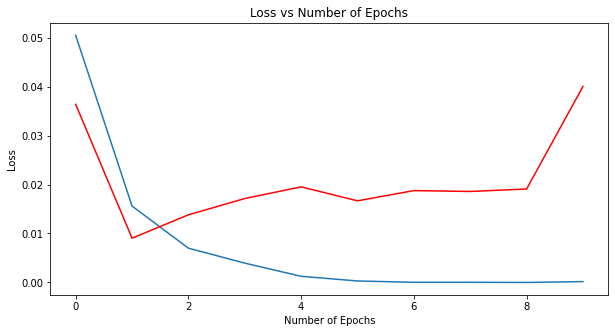

In [ ]:
# Plot loss
num_epochs = np.arange(len(train_loss_set))

fig, ax = plt.subplots(figsize=(10, 5));
ax.plot(num_epochs, np.array(train_loss_set), label="Train Loss")
ax.plot(num_epochs, np.array(test_loss_set), 'r-', label="Test Loss")
ax.set_xlabel("Number of Epochs")
ax.set_ylabel("Loss")
ax.set_title("Loss vs Number of Epochs")

Text(0.5, 1.0, 'Loss vs Number of Epochs')

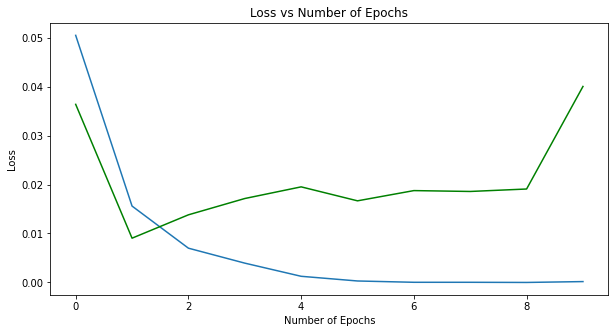

In [ ]:
# Plot loss
num_epochs = np.arange(len(train_loss_set))

fig, ax = plt.subplots(figsize=(10, 5));
ax.plot(num_epochs, np.array(train_loss_set), label="Train Loss")
ax.plot(num_epochs, np.array(valid_loss_set), 'g-', label="Valid Loss")
ax.set_xlabel("Number of Epochs")
ax.set_ylabel("Loss")
ax.set_title("Loss vs Number of Epochs")

## Prediction on unlabeled dataset in supervised setting:

In [ ]:
def generate_predictions(model, df, num_labels, device="cpu", batch_size=32):
  num_iter = math.ceil(df.shape[0]/batch_size)
  
  pred_probs = np.array([]).reshape(0, num_labels)
  
  model.to(device)
  model.eval()
  
  for i in range(num_iter):
    df_subset = df.iloc[i*batch_size:(i+1)*batch_size,:]
    X = df_subset["features"].values.tolist()
    masks = df_subset["masks"].values.tolist()
    X = torch.tensor(X)
    masks = torch.tensor(masks, dtype=torch.long)
    X = X.to(device)
    masks = masks.to(device)
    with torch.no_grad():
      logits = model(input_ids=X, attention_mask=masks)
      logits = logits.sigmoid().detach().cpu().numpy()
      pred_probs = np.vstack([pred_probs, logits])
  
  return pred_probs

In [ ]:
label_cols = ["Asking_for_information", "Providing_information"]
num_labels = len(label_cols)
pred_probs_valid = generate_predictions(model, X_valid, num_labels, device="cuda", batch_size=32)
pred_probs_test = generate_predictions(model, X_test, num_labels, device="cuda", batch_size=32)

In [ ]:
X_valid["Asking_for_information"] = pred_probs_valid[:,0]
X_valid["Providing_information"] = pred_probs_valid[:,1]
X_test["Asking_for_information"] = pred_probs_test[:,0]
X_test["Providing_information"] = pred_probs_test[:,1]

In [ ]:
label_cols = ["Asking_for_information", "Providing_information"]
Y_pred_valid = X_valid[label_cols].values.tolist()
Y_pred_test = X_test[label_cols].values.tolist()

In [ ]:
Y_pred_valid=np.argmax(Y_pred_valid, axis=1)
Y_pred_test=np.argmax(Y_pred_test, axis=1)
Y_valid_targets=np.argmax(Y_valid_targets, axis=1)
Y_test_targets=np.argmax(Y_test_targets, axis=1)

In [ ]:
print(accuracy_score(Y_valid_targets, Y_pred_valid))

0.9318181818181818


In [ ]:
print(classification_report(Y_valid_targets, Y_pred_valid, target_names=label_cols))

                        precision    recall  f1-score   support

Asking_for_information       1.00      0.79      0.88        14
 Providing_information       0.91      1.00      0.95        30

              accuracy                           0.93        44
             macro avg       0.95      0.89      0.92        44
          weighted avg       0.94      0.93      0.93        44



In [ ]:
print(classification_report(Y_test_targets, Y_test_targets, target_names=label_cols))

                        precision    recall  f1-score   support

Asking_for_information       0.93      0.82      0.87        34
 Providing_information       0.92      0.97      0.95        75

              accuracy                           0.93       109
             macro avg       0.93      0.90      0.91       109
          weighted avg       0.93      0.93      0.93       109



## Self Training:

Step 1: First, train a XL-Net classifier on the labeled training data.

Step 2: Next, use the classifier to predict labels for all unlabeled data, as well as probabilities for those predictions. In this case, I will only adopt ‘pseudo-labels’ for predictions with greater than 92% probability.

Step 3: Concatenate the ‘pseudo-labeled’ data with the labeled training data, and re-train the classifier on the concatenated data.

Step 4: Use trained classifier to make predictions for the labeled test data, and evaluate the classifier.

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Train loss: 0.0007239847825269204
Valid loss: 0.019177693592284595


Epoch: 100%|██████████| 1/1 [00:38<00:00, 38.43s/it]

Saving model at epoch 0 with validation loss of 0.019177693592284595


Now predicting labels for unlabeled data...



Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration 0
6847 high-probability predictions added to training data.
496 unlabeled instances remaining.

Train loss: 0.0037599176278158004
Valid loss: 0.015369186278244634


Epoch: 100%|██████████| 1/1 [00:33<00:00, 33.22s/it]

Saving model at epoch 0 with validation loss of 0.015369186278244634


Now predicting labels for unlabeled data...



Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration 1
243 high-probability predictions added to training data.
253 unlabeled instances remaining.

Train loss: 0.0015262205065424551
Valid loss: 0.01794922709941936


Epoch: 100%|██████████| 1/1 [00:33<00:00, 33.23s/it]

Saving model at epoch 0 with validation loss of 0.01794922709941936


Now predicting labels for unlabeled data...



Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration 2
237 high-probability predictions added to training data.
16 unlabeled instances remaining.

Train loss: 3.4819656258101796e-05
Valid loss: 0.018443723992669397


Epoch: 100%|██████████| 1/1 [00:33<00:00, 33.44s/it]

Saving model at epoch 0 with validation loss of 0.018443723992669397


Now predicting labels for unlabeled data...



Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration 3
13 high-probability predictions added to training data.
3 unlabeled instances remaining.

Train loss: 2.5496760843364258e-05
Valid loss: 0.0191486467857397


Epoch: 100%|██████████| 1/1 [00:33<00:00, 33.15s/it]

Saving model at epoch 0 with validation loss of 0.0191486467857397


Now predicting labels for unlabeled data...
Iteration 4
0 high-probability predictions added to training data.
3 unlabeled instances remaining.



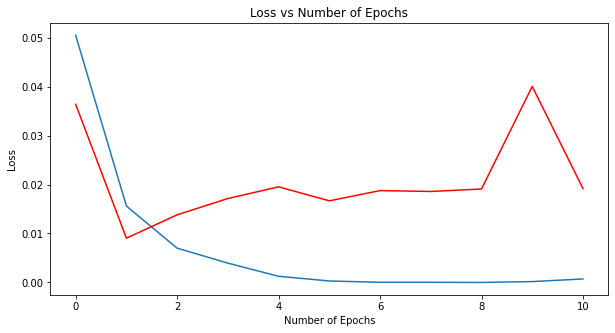

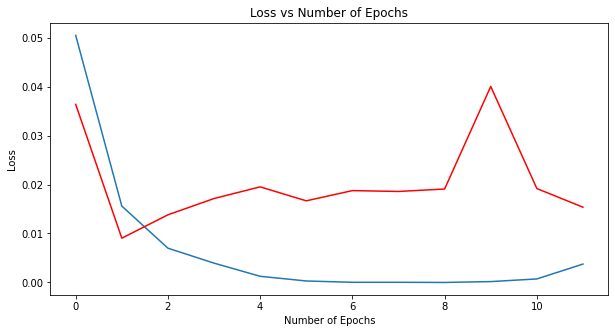

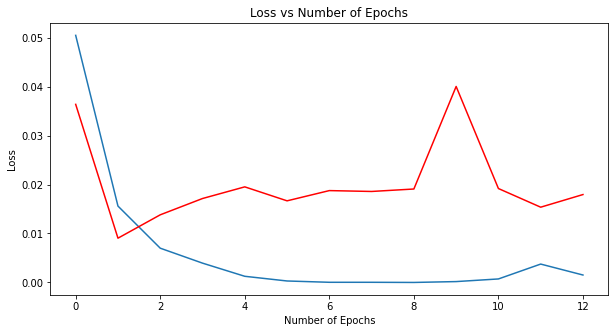

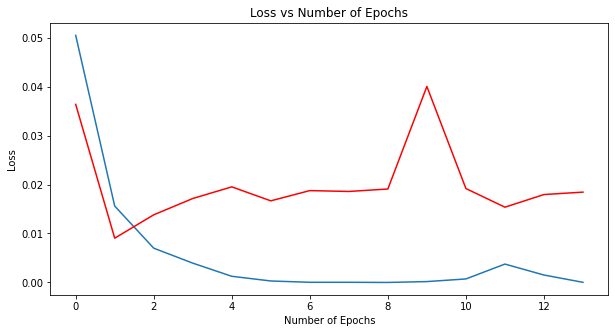

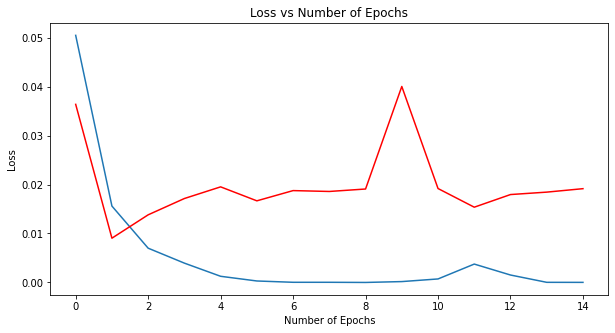

In [ ]:
# Initiate iteration counter
iterations = 0
label_cols = ["Asking_for_information", "Providing_information"]
num_labels = len(label_cols)

# Containers to hold # of pseudo-labels
pseudo_labels = []

# Assign value to initiate while loop
high_prob = [1] 

# Loop will run until there are no more high-probability pseudo-labels
while len(high_prob) > 0:

    # Fit classifier and make train/test predictions
    num_epochs=1

    cwd = os.getcwd()
    model_save_path = output_model_file = os.path.join(cwd, "/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/processed_data/xlnet_toxic.bin")
    model, train_loss_set, test_loss_set =  train_model(model=model,\
                                                        num_epochs=num_epochs,\
                                                        optimizer=optimizer,\
                                                        train_dataloader=train_dataloader,\
                                                        valid_dataloader=test_dataloader,\
                                                        model_save_path=model_save_path,\
                                                        device="cuda")
    # Plot loss
    num_epochs = np.arange(len(train_loss_set))

    fig, ax = plt.subplots(figsize=(10, 5));
    ax.plot(num_epochs, np.array(train_loss_set), label="Train Loss")
    ax.plot(num_epochs, np.array(test_loss_set), 'r-', label="Test Loss")
    ax.set_xlabel("Number of Epochs")
    ax.set_ylabel("Loss")
    ax.set_title("Loss vs Number of Epochs")

    # Generate predictions and probabilities for unlabeled data
    print(f"Now predicting labels for unlabeled data...")
    pred_probs = generate_predictions(model, X_unlabeled, num_labels, device="cuda", batch_size=32)
    X_unlabeled["Asking_for_information"] = pred_probs[:,0]
    X_unlabeled["Providing_information"] = pred_probs[:,1]

    # Calculate and print iteration 
    print(f"Iteration {iterations}")

    # Store predictions and probabilities in dataframe
    df_pred_prob = pd.DataFrame([])
    df_pred_prob['Asking_for_information'] = X_unlabeled["Asking_for_information"]
    df_pred_prob['Providing_information'] = X_unlabeled["Providing_information"]
    df_pred_prob.index = X_unlabeled.index
    
    # Separate predictions with > 92% probability
    high_prob = pd.concat([df_pred_prob.loc[df_pred_prob['Asking_for_information'] > 0.92],
                           df_pred_prob.loc[df_pred_prob['Providing_information'] > 0.92]], axis=0)
    
    print(f"{len(high_prob)} high-probability predictions added to training data.")    
    pseudo_labels.append(len(high_prob))

    # Add pseudo-labeled data to training data
    X_train = pd.concat([X_train, X_unlabeled.loc[high_prob.index]], axis=0)
    
    # Drop pseudo-labeled instances from unlabeled data
    X_unlabeled = X_unlabeled.drop(index=high_prob.index)
    print(f"{len(X_unlabeled)} unlabeled instances remaining.\n")
    
    # Update iteration counter
    iterations += 1

In [ ]:
len(X_train), len(X_unlabeled)

(7731, 3)

In [ ]:
X_train.head(15)

,full_text,Asking_for_information,Providing_information,features,masks
335,we re probably only trying to keep your factor...,1.0,0.0,"[80, 17, 88, 885, 114, 619, 22, 435, 73, 3350,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
237,I dropped my mass by 0 02,0.0,1.0,"[17, 150, 1695, 94, 2027, 37, 700, 17, 3651, 4...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
193,I chose the smallest values to give smallest w...,0.0,1.0,"[17, 150, 4113, 18, 12381, 2982, 22, 371, 1238...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
47,the mass was 0 24 with the diameter at 70...,0.0,1.0,"[18, 2027, 30, 700, 923, 33, 18, 9503, 38, 241...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
116,I have mass equals to 0 12 and factorofs...,0.0,1.0,"[17, 150, 47, 2027, 2711, 23, 22, 700, 421, 21...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
107,I don t know what has changed Ill rebroadcast...,0.0,1.0,"[17, 150, 220, 17, 46, 175, 113, 51, 1318, 419...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
264,stop changing,0.0,1.0,"[829, 3110, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
390,thats my boy max,0.0,1.0,"[29, 23, 94, 2001, 17, 8467, 4, 3, 0, 0, 0, 0,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
353,whoever changed please not go back,1.0,0.0,"[15119, 1318, 1282, 50, 216, 126, 4, 3, 0, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
432,what on s your primary factorofsafety?,1.0,0.0,"[113, 31, 17, 23, 73, 1827, 3350, 1168, 11103,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [ ]:
X_unlabeled.head(15)

,full_text,features,masks,Asking_for_information,Providing_information
2417,I have mass at 0 14 and factorofsafety at ...,"[17, 150, 47, 2027, 38, 700, 613, 21, 3350, 11...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.310912,0.717981
2418,I have mass at 0 14 and factorofsafety at ...,"[17, 150, 47, 2027, 38, 700, 613, 21, 3350, 11...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.310912,0.717981
3693,get you factor of safety as close to 2,"[133, 44, 3350, 20, 1445, 34, 474, 22, 159, 4,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.860445,0.074920


## Re-running self-training with more epochs to accomodate the last 3 data points, if possible:

In [ ]:
optimizer = AdamW(model.parameters(), lr=2e-5, weight_decay=0.001, correct_bias=False)

Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Train loss: 0.0070842975859129334
Valid loss: 0.04266809296170506


Epoch:  33%|███▎      | 1/3 [00:33<01:06, 33.12s/it]

Saving model at epoch 0 with validation loss of 0.04266809296170506


Train loss: 0.006400168337032992
Valid loss: 0.022648448145888542


Epoch:  67%|██████▋   | 2/3 [01:06<00:33, 33.14s/it]

Saving model at epoch 1 with validation loss of 0.022648448145888542


Train loss: 0.0029011142060569334


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 0.024125508285862386


Now predicting labels for unlabeled data...
Iteration 0
3 high-probability predictions added to training data.
0 unlabeled instances remaining.

Train loss: 0.0033722435357346845
Valid loss: 0.041371414891803


Epoch:  33%|███▎      | 1/3 [00:33<01:06, 33.08s/it]

Saving model at epoch 0 with validation loss of 0.041371414891803


Train loss: 0.002810018053730888
Valid loss: 0.021881387636296178


Epoch:  67%|██████▋   | 2/3 [01:06<00:33, 33.11s/it]

Saving model at epoch 1 with validation loss of 0.021881387636296178


Train loss: 0.00047251979424141804


Epoch: 100%|██████████| 3/3 [01:37<00:00, 32.47s/it]

Valid loss: 0.02653990034174191


Now predicting labels for unlabeled data...
Iteration 1
0 high-probability predictions added to training data.
0 unlabeled instances remaining.



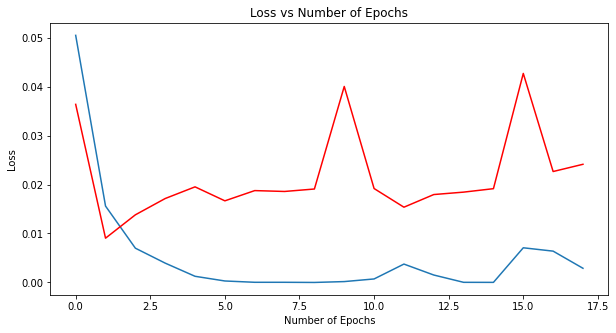

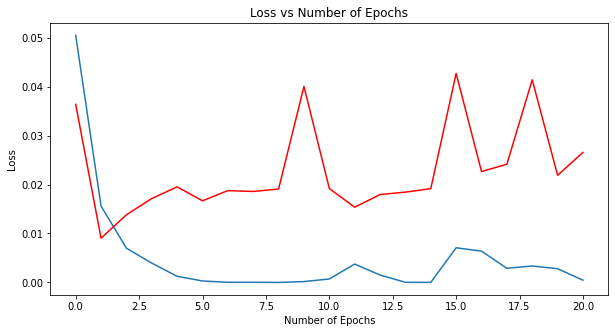

In [ ]:
# Initiate iteration counter
iterations = 0
label_cols = ["Asking_for_information", "Providing_information"]
num_labels = len(label_cols)

# Containers to hold # of pseudo-labels
pseudo_labels = []

# Assign value to initiate while loop
high_prob = [1] 

# Loop will run until there are no more high-probability pseudo-labels
while len(high_prob) > 0:

    # Fit classifier and make train/test predictions
    num_epochs=3

    cwd = os.getcwd()
    model_save_path = output_model_file = os.path.join(cwd, "/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/processed_data/xlnet_toxic.bin")
    model, train_loss_set, test_loss_set =  train_model(model=model,\
                                                        num_epochs=num_epochs,\
                                                        optimizer=optimizer,\
                                                        train_dataloader=train_dataloader,\
                                                        valid_dataloader=test_dataloader,\
                                                        model_save_path=model_save_path,\
                                                        device="cuda")
    # Plot loss
    num_epochs = np.arange(len(train_loss_set))

    fig, ax = plt.subplots(figsize=(10, 5));
    ax.plot(num_epochs, np.array(train_loss_set), label="Train Loss")
    ax.plot(num_epochs, np.array(test_loss_set), 'r-', label="Test Loss")
    ax.set_xlabel("Number of Epochs")
    ax.set_ylabel("Loss")
    ax.set_title("Loss vs Number of Epochs")

    # Generate predictions and probabilities for unlabeled data
    print(f"Now predicting labels for unlabeled data...")
    pred_probs = generate_predictions(model, X_unlabeled, num_labels, device="cuda", batch_size=32)
    X_unlabeled["Asking_for_information"] = pred_probs[:,0]
    X_unlabeled["Providing_information"] = pred_probs[:,1]

    # Calculate and print iteration 
    print(f"Iteration {iterations}")

    # Store predictions and probabilities in dataframe
    df_pred_prob = pd.DataFrame([])
    df_pred_prob['Asking_for_information'] = X_unlabeled["Asking_for_information"]
    df_pred_prob['Providing_information'] = X_unlabeled["Providing_information"]
    df_pred_prob.index = X_unlabeled.index
    
    # Separate predictions with > 92% probability
    high_prob = pd.concat([df_pred_prob.loc[df_pred_prob['Asking_for_information'] > 0.92],
                           df_pred_prob.loc[df_pred_prob['Providing_information'] > 0.92]], axis=0)
    
    print(f"{len(high_prob)} high-probability predictions added to training data.")    
    pseudo_labels.append(len(high_prob))

    # Add pseudo-labeled data to training data
    X_train = pd.concat([X_train, X_unlabeled.loc[high_prob.index]], axis=0)
    
    # Drop pseudo-labeled instances from unlabeled data
    X_unlabeled = X_unlabeled.drop(index=high_prob.index)
    print(f"{len(X_unlabeled)} unlabeled instances remaining.\n")
    
    # Update iteration counter
    iterations += 1

In [ ]:
len(X_unlabeled), len(X_train)

(0, 7734)

In [ ]:
X_train.head(15)

,full_text,Asking_for_information,Providing_information,features,masks
335,we re probably only trying to keep your factor...,1.0,0.0,"[80, 17, 88, 885, 114, 619, 22, 435, 73, 3350,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
237,I dropped my mass by 0 02,0.0,1.0,"[17, 150, 1695, 94, 2027, 37, 700, 17, 3651, 4...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
193,I chose the smallest values to give smallest w...,0.0,1.0,"[17, 150, 4113, 18, 12381, 2982, 22, 371, 1238...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
47,the mass was 0 24 with the diameter at 70...,0.0,1.0,"[18, 2027, 30, 700, 923, 33, 18, 9503, 38, 241...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
116,I have mass equals to 0 12 and factorofs...,0.0,1.0,"[17, 150, 47, 2027, 2711, 23, 22, 700, 421, 21...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
107,I don t know what has changed Ill rebroadcast...,0.0,1.0,"[17, 150, 220, 17, 46, 175, 113, 51, 1318, 419...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
264,stop changing,0.0,1.0,"[829, 3110, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
390,thats my boy max,0.0,1.0,"[29, 23, 94, 2001, 17, 8467, 4, 3, 0, 0, 0, 0,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
353,whoever changed please not go back,1.0,0.0,"[15119, 1318, 1282, 50, 216, 126, 4, 3, 0, 0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ..."
432,what on s your primary factorofsafety?,1.0,0.0,"[113, 31, 17, 23, 73, 1827, 3350, 1168, 11103,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


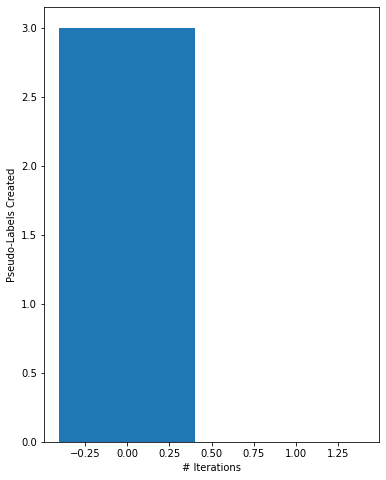

In [ ]:
# Plot f1 scores and number of pseudo-labels added for all iterations
fig, ax = plt.subplots(figsize=(6,8))
ax.bar(x=range(iterations), height=pseudo_labels)
ax.set_ylabel('Pseudo-Labels Created')
ax.set_xlabel('# Iterations');

## Final Dataset Output | Post-Processing:

In [ ]:
X_train.drop(['features', 'masks'], axis = 1, inplace= True)
X_train['label'] = np.where(X_train['Asking_for_information'] > X_train['Providing_information'], 'Asking_for_information', 'Providing_information')
X_train.drop(['Asking_for_information', 'Providing_information'], axis = 1, inplace= True)
X_train.reset_index(inplace=True)
X_train.drop(['index'], axis = 1, inplace= True)

In [ ]:
X_train.to_csv('/content/drive/MyDrive/projects/Capstone_Project/Checkpoint_6/final_output_1.csv', index = False, sep = ',')